In [1]:
from  google.colab import drive  
drive.mount('/content/drive')
%cd /content/drive/My\ Drive/algo trading/stocks
### save and load data using pickle
import pickle
def psave(dataframe, fname):
    with open('{}.pkl'.format(fname),'wb') as pickle_file:
        pickle.dump(dataframe,pickle_file)
        
def pload(fname):
  
  with open('{}.pkl'.format(fname),'rb') as pickle_file:
      dataframe=pickle.load(pickle_file)
      return dataframe

Mounted at /content/drive
/content/drive/My Drive/algo trading/stocks


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math as mt
import datetime

from itertools import product
import sys

In [13]:
sys.path.append("/content/drive/MyDrive/Colab Notebooks/classes")
%reload_ext autoreload
%autoreload 2
from trading_main import account
from PropertyTest_DataGeneration import Gen as g
from DfPlot import dp

In [6]:
train_s=np.datetime64('2013-12-30')
train_e=np.datetime64('2017-12-29')

vali_s=np.datetime64('2018-01-02')
vali_e=np.datetime64('2018-12-31')

test_s=np.datetime64('2019-01-02')
test_e=np.datetime64('2019-12-30')
df=pload('selectedpairs')

df = df.rename(columns={'return': 'ret'})

In [7]:
StockData=pload('StockPool')

In [112]:
###implementing strategy under a trading simulator

def Strat(df1,i,startdate,enddate,StockData,short,short_e,long_,long_e,interest=0.03,keyword1='spread',keyword2='spread'):

  #initialization
  stratRecord=['NAN']
  moneyRecord=[10000]
  acc=account(10000,startdate,StockData,PrintRecord=False)
  
  #start trading
  while enddate>acc.CheckDate(1):
    money=acc.CheckMoney()
    date=acc.CheckDate()
    to=acc.CheckDate(1)
    
    Y=df1.iloc[i]['pair'][0]
    X=df1.iloc[i]['pair'][1]
    spread1=df1.iloc[i][keyword1].loc[date]
    spread2=df1.iloc[i][keyword2].loc[to]
    #calculate percentage change (return) at time t+1
    ret=(spread2-spread1)/spread1


    

    

    #Check wether to close position
    if stratRecord[-1]=='Long':
      if ret < long_e:


        
        acc.Close([Y,X])
        moneyRecord.append(acc.CheckMoney())
        #an unprofitable trade
        if moneyRecord[-2]>moneyRecord[-1]:
          stratRecord.append('Clear(l)')
        #a profitable trade
        else:
          stratRecord.append('Clear(g)')

        
    elif stratRecord[-1]=='Short':
      if ret > short_e:
        
        acc.Close([Y,X])
        moneyRecord.append(acc.CheckMoney())
        if moneyRecord[-2]>moneyRecord[-1]:
          stratRecord.append('Clear(l)')
        else:
          stratRecord.append('Clear(g)')
        
    #check wether to open position    
    elif acc.CheckMoney()>=0:
      beta=df1.iloc[i]['beta']
      y_price=acc.CheckCurrentValue(Y,'Adj Close')
      x_price=acc.CheckCurrentValue(X,'Adj Close')
    
      if ret<short:
        moneyRecord.append(acc.CheckMoney())
        stratRecord.append('Short')
        x_volume=mt.floor(money/x_price)
        y_volume=mt.floor(x_volume/beta)
        acc.Sell(Y,y_volume)
        acc.Buy(X,x_volume)
          


      elif ret>long_:
        moneyRecord.append(acc.CheckMoney())
        stratRecord.append('Long')
        y_volume=mt.floor(money/y_price)
        x_volume=mt.floor(y_volume*beta)
        acc.Sell(X,x_volume)
        acc.Buy(Y,y_volume) 

    acc.IncementDay()

  
  
#trade ends, close all position
  if stratRecord[-1]=='Short' or stratRecord[-1]=='Long':
    acc.Close([Y,X])
    stratRecord.append('Clear')
  
  totalAsset=acc.TotalAsset()

#calculate interest of shorting stocks
  if interest>0:


    ##interest(Market Value x Interest Rate x # of days) / 365
    b=acc.ShowTradeRecord()
    tran=0
    for i in range(len(b.index)):
      if i%4==0:
        short=b.iloc[i]
        market_value=short['price']*(-short['volume'])
        start=short['time']
        j=i+3
        if j<len(b.index):
          exit=b.iloc[j]
          end=exit['time']
          
          days=int((end-start)/np.timedelta64(1, 'D'))
         
          tran+=(market_value*interest*days/365)

    #Calculating rate of return
    TotalReturn=totalAsset/10000-1
    

  
  
  
  return acc,stratRecord,TotalReturn


In [10]:

#search the best(sn, sp, lp, ln)
def search(para_t,df):
  best_paral=[]
  best_retl=[]
  best_recordl=[]

  for i in range(len(df)):
    rp=df.iloc[i]['ret'].loc[train_s:train_e].loc[(df.iloc[i]['ret']>0)]
    rn=df.iloc[i]['ret'].loc[train_s:train_e].loc[(df.iloc[i]['ret']<0)]
 

  
    ret=0
    best_para=()
    best_return=0
    best_record=[]
    for paras in para_t:
      

      acc,stratRecord,TotalReturn=Strat(df,i,vali_s,vali_e,StockData,rn.quantile(paras[0]),rp.quantile(paras[1]),rp.quantile(paras[2]),rn.quantile(paras[3]))
      if TotalReturn >ret:
        ret=TotalReturn
        best_para=paras
        best_return=TotalReturn
        best_record=stratRecord



    best_paral.append(best_para)
    best_retl.append(best_return)
    best_recordl.append(best_record)
    print(i,'done')

    psave([best_paral,best_retl,best_recordl],'QTT{}'.format(i))


  return best_paral,best_retl,best_recordl



In [11]:

d={'short':[0.1,0.15,0.2,0.25,0.3,0.35],'short_e':[0,0.05,0.1,0.15,0.2],'long':[0.9,0.85,0.8,0.75,0.7,0.65],'long_e':[1,0.95,0.9,0.85,0.8]}

best_paral,best_retl,best_recordl=search(list(product(*d.values())),df)
  
  


14 done
15 done
16 done
17 done
18 done
19 done


In [13]:
#seperately trained
d=pload('QTT13')
d1=pload('QTT19')

In [20]:
d2=['para','vali_return','vali_record']
for  i in [0,1,2]:
  df[d2[i]]=d[i]+d1[i]

In [22]:
psave(df,'selectedpairs_para')

In [21]:
df

,cross,mean1,pair,beta,spread,ret,mean2,cross2,mean3,cross3,meandiff,T,para,vali_return,vali_record
363082,37,-33.884243,"[CTHR, HAYN]",0.050000,Date 2013-12-02 2.929801 2013-12-03 2.79...,Date 2013-12-02 -0.044655 2013-12-03 -0.01...,-0.242134,40,-0.571331,18,0.329197,51.0,(),0.000000,[]
99348,33,-17.050050,"[AVNW, MMYT]",0.146939,Date 2013-12-02 11.808979 2013-12-03 11....,Date 2013-12-02 -0.025819 2013-12-03 -0.03...,3.632221,49,3.595694,26,0.036528,42.0,"(0.35, 0.05, 0.7, 0.85)",87.561959,"[NAN, Long, Clear, Long, Clear, Long, Clear, L..."
288449,36,-27.130426,"[VOXX, NTCT]",0.224490,Date 2013-12-02 10.296735 2013-12-03 10....,Date 2013-12-02 0.029433 2013-12-03 -0.01...,-0.577103,57,-0.680304,28,0.103202,36.0,(),0.000000,[]
216234,35,-2.241410,"[TCBIL, VLGEA]",0.534694,Date 2013-12-02 1.446036 2013-12-03 1....,Date 2013-12-02 -0.154412 2013-12-03 1.13...,8.002588,53,8.540720,14,-0.538132,39.0,"(0.35, 0.05, 0.65, 1)",3.588377,"[NAN, Short, Clear, Short, Clear, Short, Clear..."
314459,91,3.059907,"[FDUS, MGIC]",0.961224,Date 2013-12-02 4.596692 2013-12-03 4.48...,Date 2013-12-02 -0.023360 2013-12-03 0.00...,3.302077,91,2.671474,25,0.630603,23.0,"(0.35, 0, 0.65, 1)",4.589588,"[NAN, Short, Clear, Long, Clear, Short, Clear,..."
363238,32,-6.491330,"[CTHR, CCLP]",0.185714,Date 2013-12-02 3.362121 2013-12-03 3.20...,Date 2013-12-02 -0.045473 2013-12-03 -0.00...,0.039106,34,0.189550,34,-0.150444,60.0,"(0.35, 0, 0.65, 0.95)",27.659026,"[NAN, Short, Clear, Long, Clear, Long, Clear, ..."
365248,38,-5.172277,"[TGA, CCLP]",0.282653,Date 2013-12-02 4.670289 2013-12-03 4.67...,Date 2013-12-02 0.001556 2013-12-03 0.06...,0.580727,39,0.724924,11,-0.144197,52.0,"(0.35, 0, 0.65, 1)",8.930240,"[NAN, Short, Clear, Short, Clear, Short, Clear..."
288537,40,2.226178,"[VOXX, MARPS]",0.844898,Date 2013-12-02 9.853340 2013-12-03 10....,Date 2013-12-02 0.015442 2013-12-03 -0.00...,2.983573,48,3.017976,43,-0.034403,43.0,"(0.35, 0, 0.9, 1)",89.489938,"[NAN, Short, Clear, Short, Clear, Short, Clear..."
439897,34,-1.855255,"[MIND, CCLP]",0.728571,Date 2013-12-02 9.905243 2013-12-03 9.67...,Date 2013-12-02 -0.023199 2013-12-03 -0.03...,0.321557,35,0.012027,15,0.309530,58.0,"(0.35, 0, 0.65, 0.8)",1.409449,"[NAN, Short, Clear, Short, Clear, Short, Clear..."
99073,34,-10.444400,"[AVNW, EPZM]",0.146939,Date 2013-12-02 11.102204 2013-12-03 10....,Date 2013-12-02 -0.028125 2013-12-03 -0.05...,4.602847,44,6.254098,32,-1.651251,46.0,"(0.35, 0.05, 0.8, 1)",1371.746005,"[NAN, Long, Clear, Long, Clear, Long, Clear, S..."


(Sn,Sp,Lp,Ln) is determined , below is testing the strategy on LSTM forecasts

In [95]:
dflstm=pload('selectedpairs_LSTM')

In [113]:

def test(df,keyword='spread'):

  retl=[]
  recordl=[]
  accl=[]
  for i in range(0,len(df)):
    if df.iloc[i]['vali_record']!=[]:
      rp=df.iloc[i]['ret'].loc[train_s:train_e].loc[(df.iloc[i]['ret']>0)]
      rn=df.iloc[i]['ret'].loc[train_s:train_e].loc[(df.iloc[i]['ret']<0)]
      paras=df.iloc[i]['para']
      print(paras)

    


      acc,stratRecord,TotalReturn=Strat(df,i,test_s,test_e,StockData,rn.quantile(paras[0]),rp.quantile(paras[1]),rp.quantile(paras[2]),rn.quantile(paras[3]),keyword1='spread',keyword2=keyword)


      retl.append(TotalReturn)
      recordl.append(stratRecord)
      accl.append(acc)

    else:
      retl.append(0)
      recordl.append([])
      accl.append('nan')

    print(i,'done')



  return accl,retl,recordl


In [109]:
#relax entering signal by 0.05
def test_relax(df,keyword='spread',relax=0.05):

  retl=[]
  recordl=[]
  accl=[]
  for i in range(0,len(df)):
    if df.iloc[i]['vali_record']!=[]:
      rp=df.iloc[i]['ret'].loc[train_s:train_e].loc[(df.iloc[i]['ret']>0)]
      rn=df.iloc[i]['ret'].loc[train_s:train_e].loc[(df.iloc[i]['ret']<0)]
      paras=df.iloc[i]['para']
      print(paras)
      s=paras[0]
      s_e=paras[1]
      l=paras[2]
      l_e=paras[3]
      
      s+=relax
      
      l-=relax
        

    


      acc,stratRecord,TotalReturn=Strat(df,i,test_s,test_e,StockData,rn.quantile(s),rp.quantile(s_e),rp.quantile(l),rn.quantile(l_e),keyword1='spread',keyword2=keyword)


      retl.append(TotalReturn)
      recordl.append(stratRecord)
      accl.append(acc)

    else:
      retl.append(0)
      recordl.append([])
      accl.append('nan')

    print(i,'done')



  return accl,retl,recordl

In [114]:

accl,retl,recordl=test(dflstm,'LSTM_test')

0 done
(0.35, 0.05, 0.7, 0.85)
1 done
2 done
(0.35, 0.05, 0.65, 1)
3 done
(0.35, 0, 0.65, 1)
4 done
(0.35, 0, 0.65, 0.95)
5 done
(0.35, 0, 0.65, 1)
6 done
(0.35, 0, 0.9, 1)
7 done
(0.35, 0, 0.65, 0.8)
8 done
(0.35, 0.05, 0.8, 1)
9 done
(0.35, 0, 0.65, 1)
10 done
(0.35, 0.05, 0.75, 0.85)
11 done
12 done
(0.35, 0, 0.8, 1)
13 done
(0.35, 0.05, 0.65, 1)
14 done
(0.35, 0.2, 0.9, 0.9)
15 done
(0.35, 0.05, 0.9, 1)
16 done
17 done
(0.35, 0.1, 0.65, 1)
18 done
(0.35, 0.2, 0.8, 1)
19 done


In [115]:
retl

[0,
 0.0,
 0,
 -0.014239192581176785,
 0.0,
 1.038978458356857,
 0.0,
 0.0,
 1.86235103931427,
 0.0,
 1.0598449464321136,
 -0.16636328601837158,
 0,
 0.7986932559370994,
 0.013660235023498446,
 -0.12591062893867488,
 -0.012718526601791402,
 0,
 0.15080057907104494,
 0.6876073259115218]

In [116]:
#average return (divided by 20, by 16 it becomes 0.33)
np.array(retl).mean()

0.2646352102953195

In [46]:
#calculating total number of trades for each pair
tradetime=[]
for i in range(20):
  tradetime.append(len(recordl[i][1:])/2)


In [51]:
#calculating number of unprofitable trades for each pair
losetime=[]
for i in range(20):
  time=0
  for j in recordl[i]:
    if j=='Clear(l)':
      time+=1

  losetime.append(time)

In [52]:
losetime

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 1, 0, 5, 0, 2, 1]

In [57]:
dflstm['LSTM_testreturn']=retl
dflstm['LSTM_testtime']=tradetime
dflstm['LSTM_losetime']=losetime

In [58]:
psave(dflstm,'LSTM_result')

0
1


<Figure size 432x288 with 0 Axes>

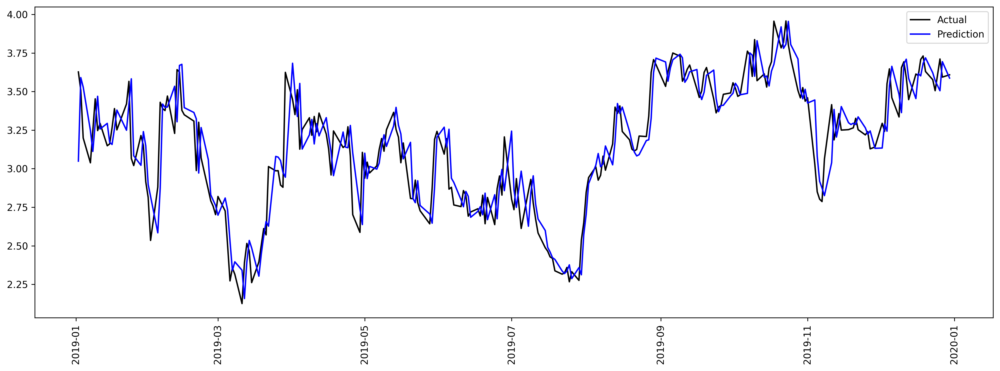

2
3


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

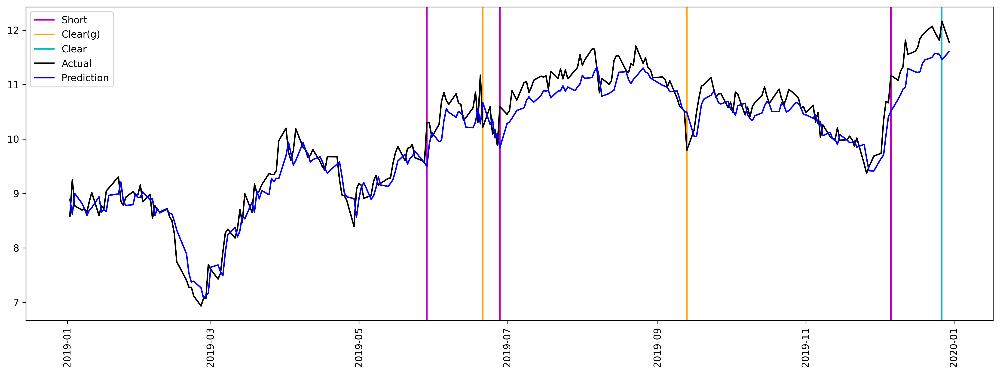

4


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

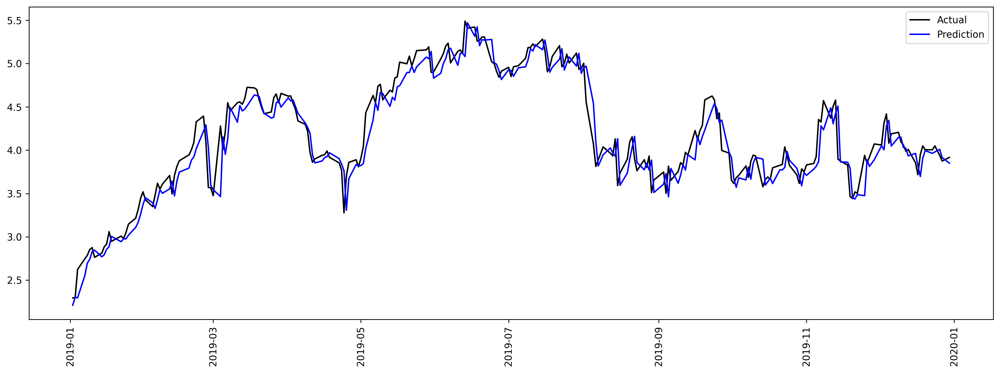

5


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

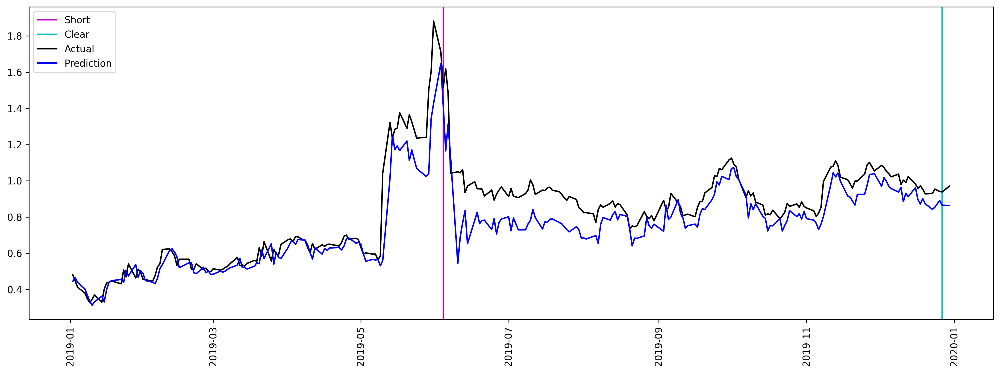

6


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

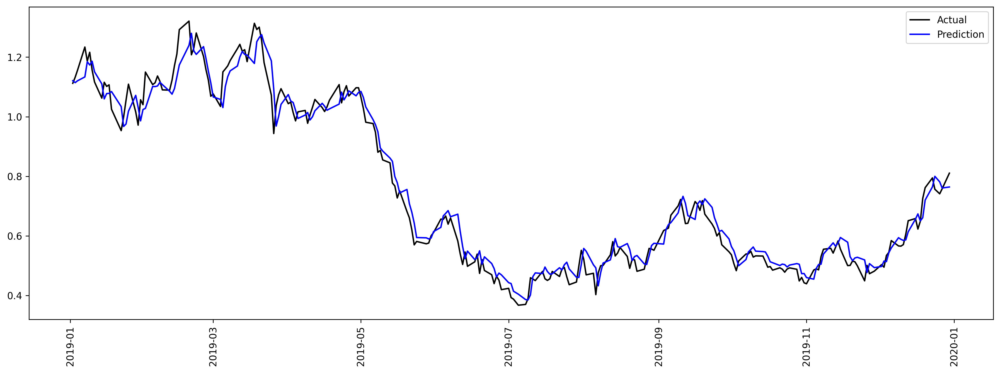

7


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

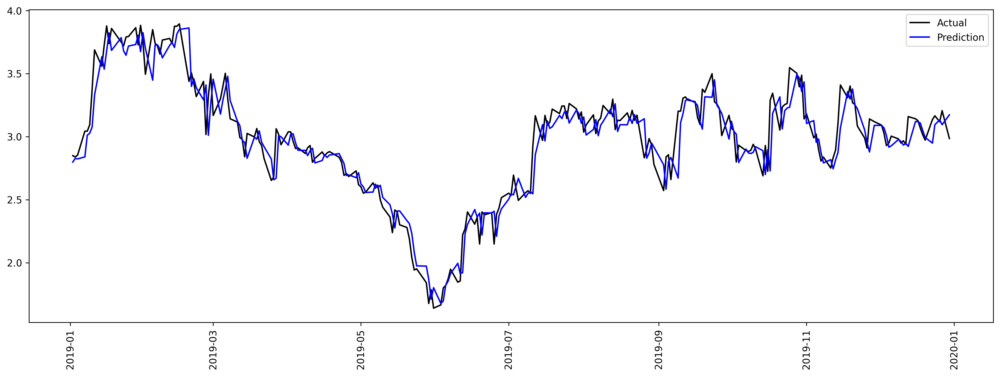

8


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

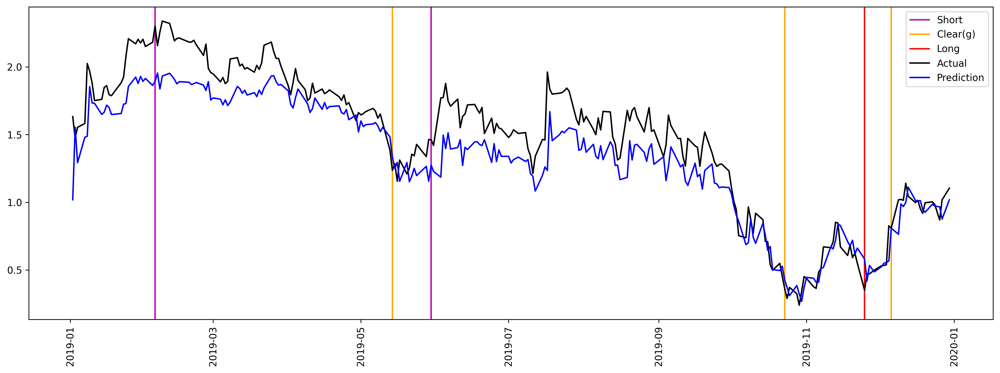

9


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

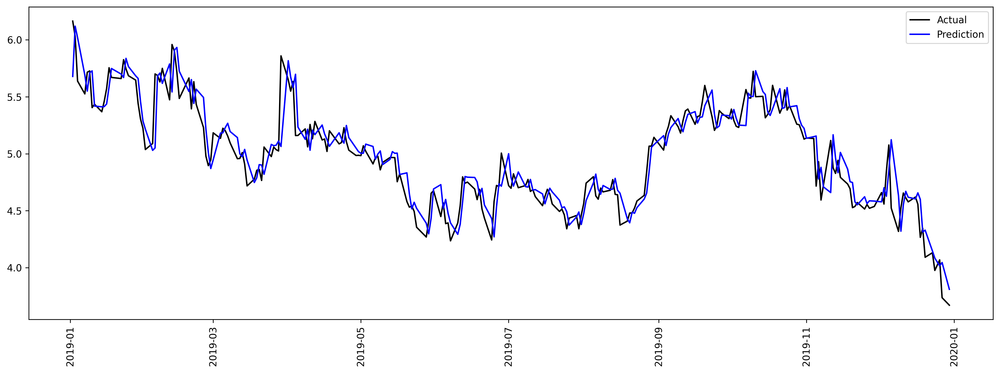

10


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

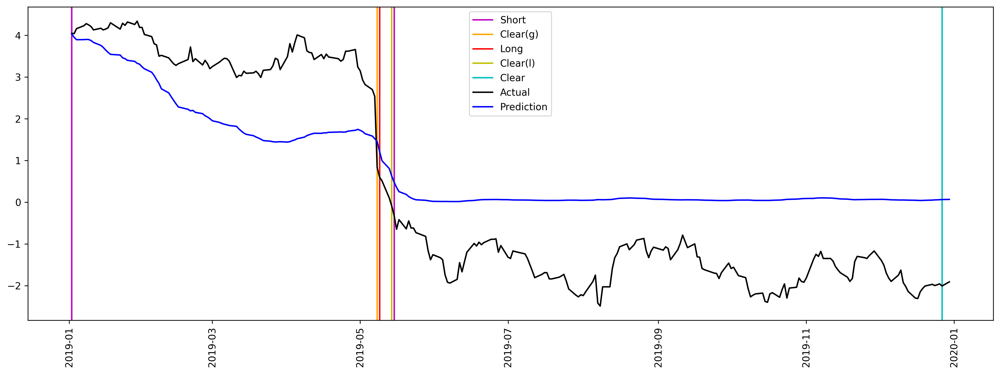

11


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

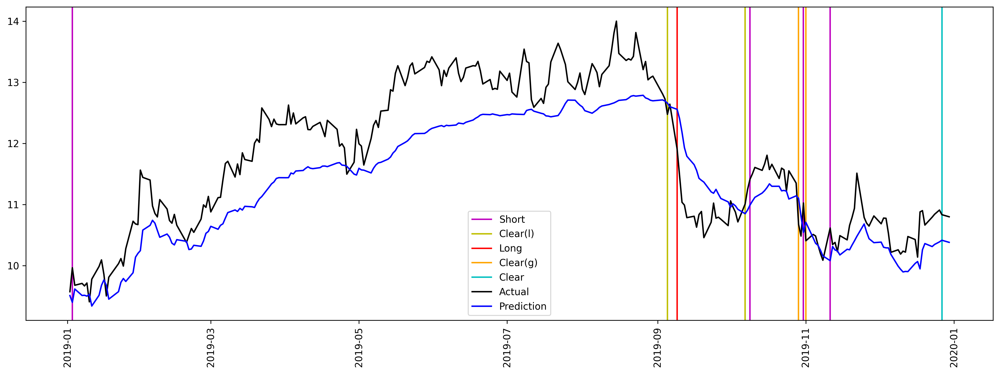

12
13


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

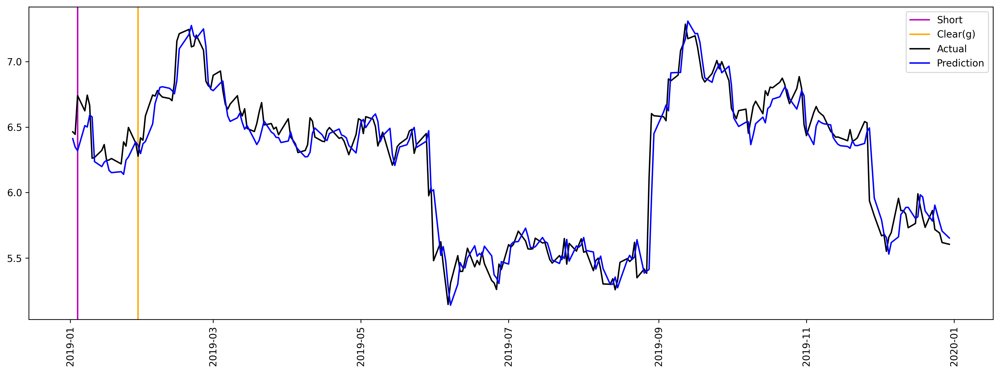

14


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

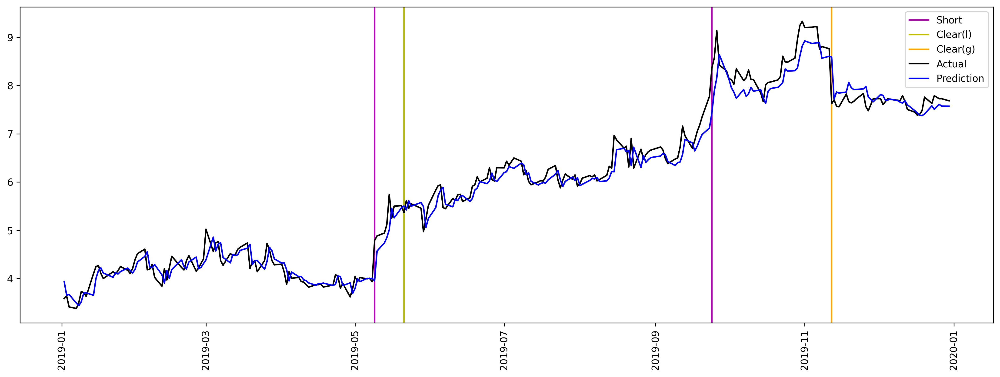

15


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

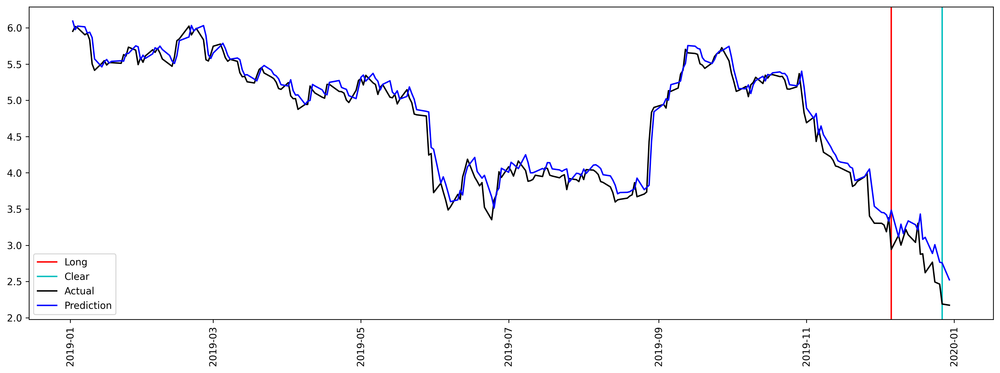

16


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

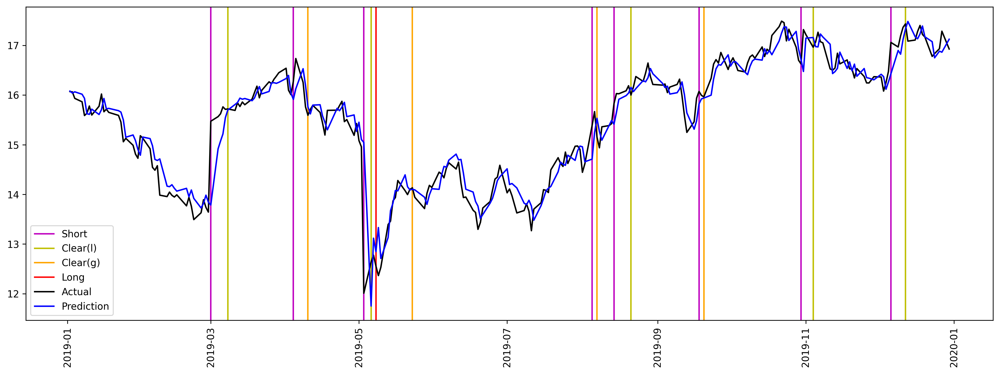

17
18


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

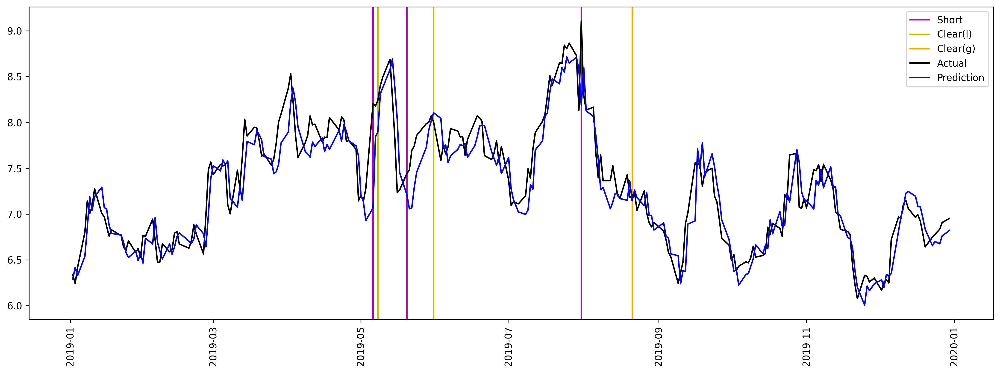

19


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

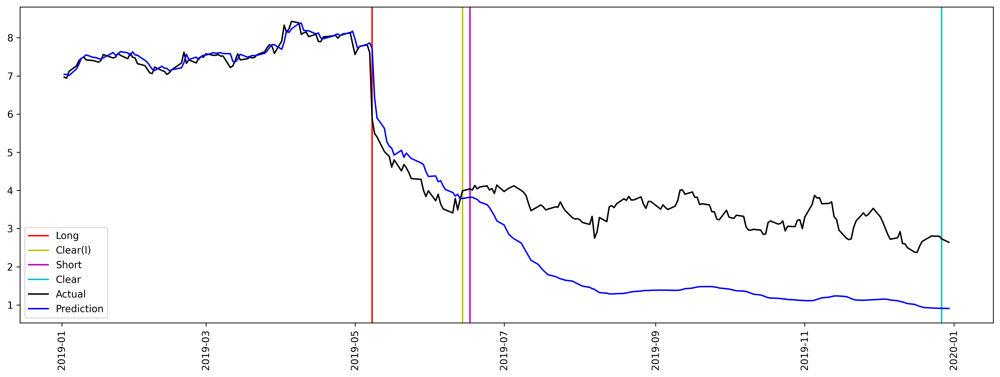

<Figure size 432x288 with 0 Axes>

In [60]:
#visualization on the testing set
colors=['m','r','y','orange','c']
      
colorDic={}
j=0
for tt in ['Short','Long','Clear(l)','Clear(g)','Clear']:
  colorDic[tt]=colors[j]
  j+=1
for i in range(len(dflstm)):
  print(i)
  if accl[i]!='nan':



    plt.figure(i)
    spread=dflstm.iloc[i]['spread']
    r=accl[i].ShowTradeRecord()
    acctime=r['time'].unique()

    dp.SRPlot([spread,dflstm.iloc[i]['LSTM_test']],['Actual','Prediction'],['black','blue'],start=test_s,end=test_e,xvline=True,listofxvlines=acctime,
            xvColor=True,xvColorDic=colorDic,xvColorIndex=recordl[i][1:])
    plt.figure(dflstm.iloc[i]['pair'][0]+dflstm.iloc[i]['pair'][1])

Testing the ARIMA estimation

In [100]:
dfarima=pload('selectedpairs_ARIMA')
accl,retl,recordl=test(dfarima,'ARIMA_test')

0 done
(0.35, 0.05, 0.7, 0.85)
1 done
2 done
(0.35, 0.05, 0.65, 1)
3 done
(0.35, 0, 0.65, 1)
4 done
(0.35, 0, 0.65, 0.95)
5 done
(0.35, 0, 0.65, 1)
6 done
(0.35, 0, 0.9, 1)
7 done
(0.35, 0, 0.65, 0.8)
8 done
(0.35, 0.05, 0.8, 1)
9 done
(0.35, 0, 0.65, 1)
10 done
(0.35, 0.05, 0.75, 0.85)
11 done
12 done
(0.35, 0, 0.8, 1)
13 done
(0.35, 0.05, 0.65, 1)
14 done
(0.35, 0.2, 0.9, 0.9)
15 done
(0.35, 0.05, 0.9, 1)
16 done
17 done
(0.35, 0.1, 0.65, 1)
18 done
(0.35, 0.2, 0.8, 1)
19 done


In [101]:
retl

[0,
 0.0,
 0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.09163691186904899,
 0.0,
 0,
 0.0,
 0.0,
 0.0,
 -0.10526401948928832,
 0,
 0.0,
 0.0]

In [102]:
tradetime=[]
for i in range(20):
  tradetime.append(len(recordl[i][1:])/2)
tradetime

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 0.0,
 0.0,
 0.0]

In [103]:
losetime=[]
for i in range(20):
  time=0
  for j in recordl[i]:
    if j=='Clear(l)':
      time+=1

  losetime.append(time)

print(losetime)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0]


In [104]:
dfarima['ARIMA_testreturn']=retl
dfarima['ARIMA_testtime']=tradetime
dfarima['ARIMA_losetime']=losetime

In [105]:
psave(dfarima,'ARIMA_result')

0
1


<Figure size 432x288 with 0 Axes>

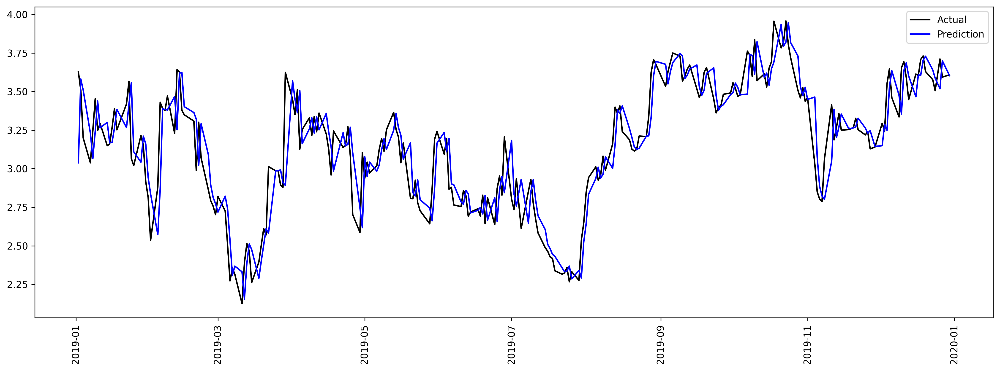

2
3


<Figure size 432x288 with 0 Axes>

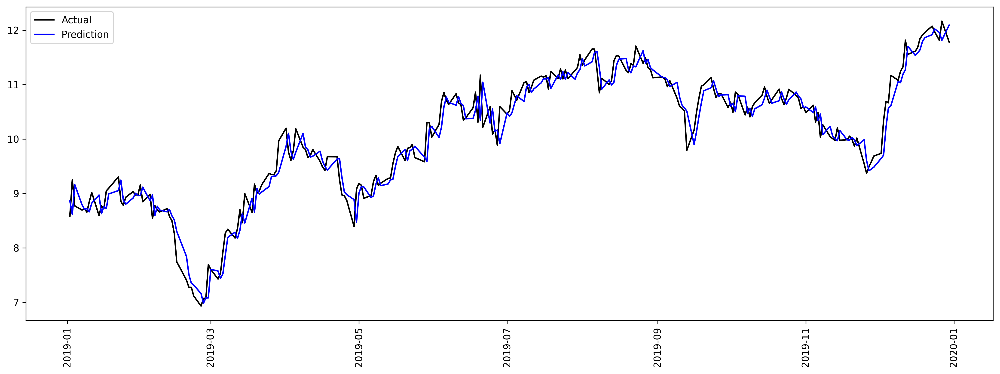

4


<Figure size 432x288 with 0 Axes>

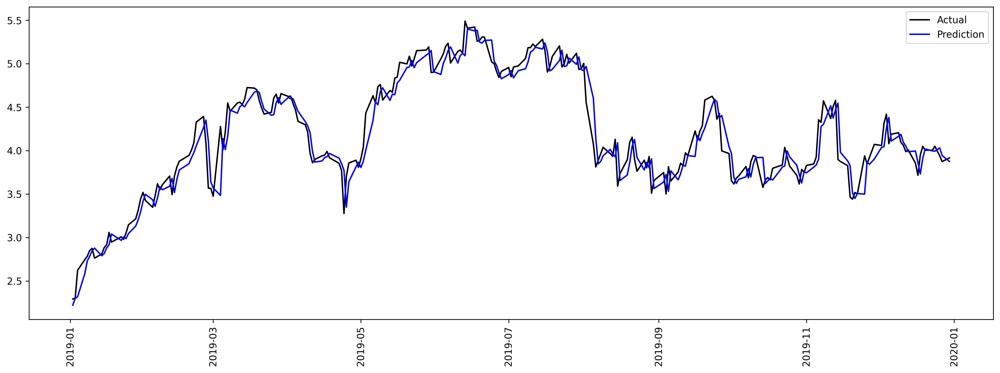

5


<Figure size 432x288 with 0 Axes>

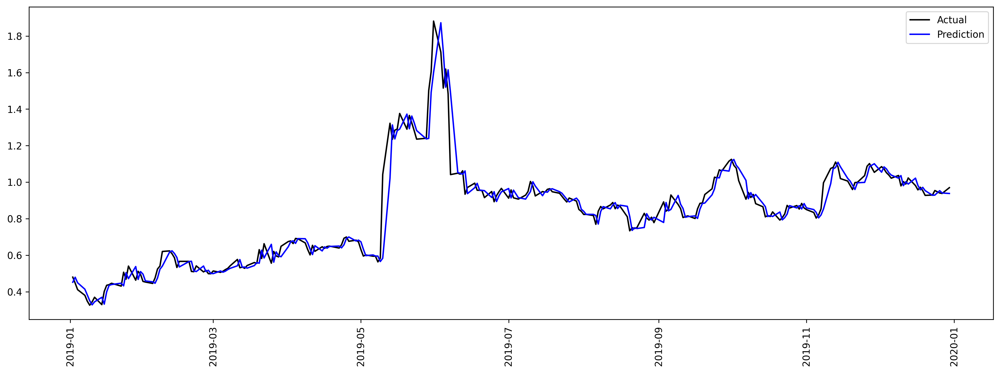

6


<Figure size 432x288 with 0 Axes>

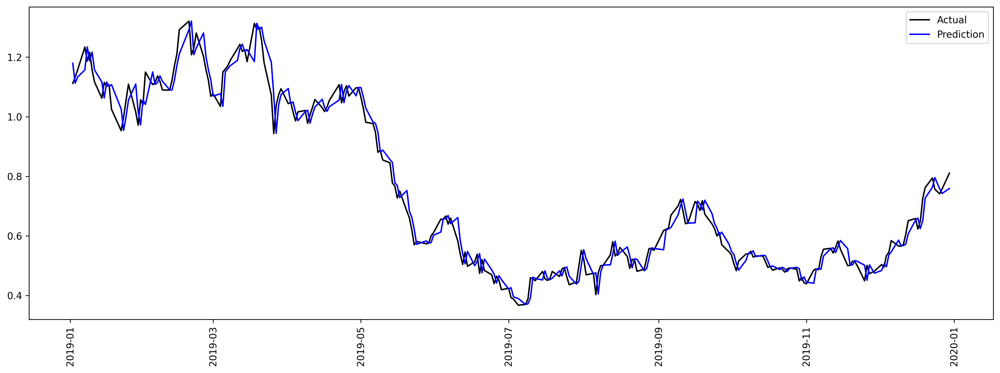

7


<Figure size 432x288 with 0 Axes>

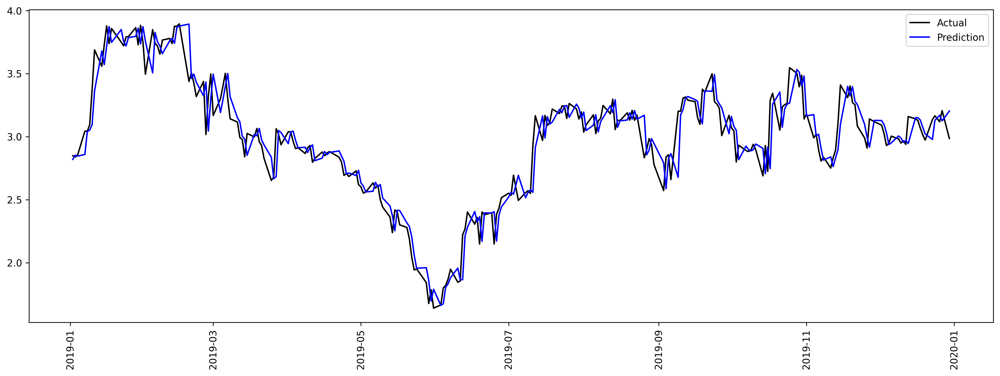

8


<Figure size 432x288 with 0 Axes>

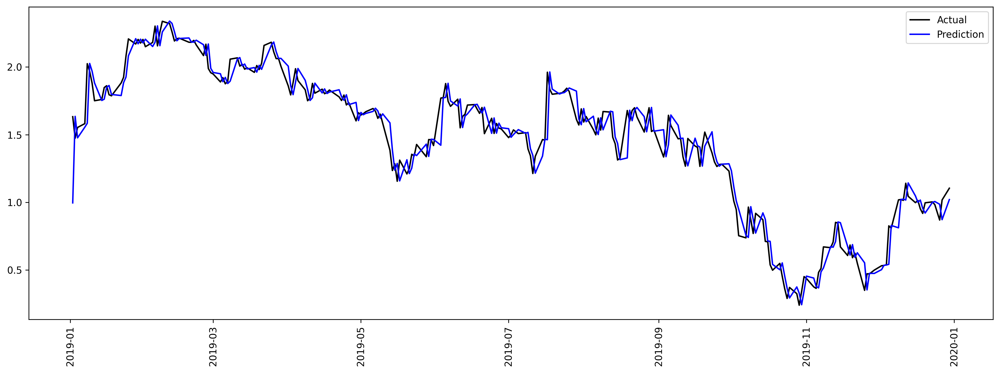

9


<Figure size 432x288 with 0 Axes>

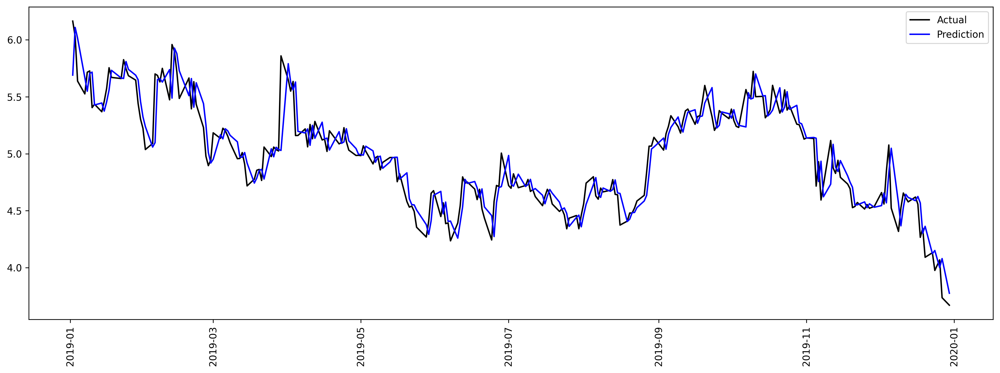

10


<Figure size 432x288 with 0 Axes>

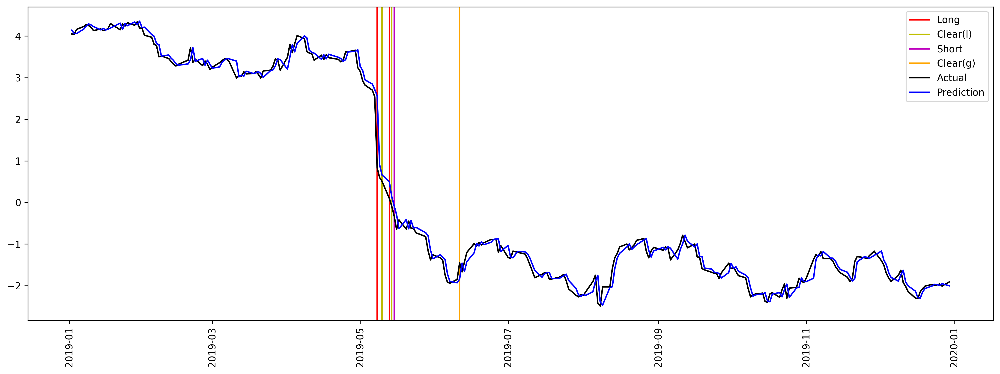

11


<Figure size 432x288 with 0 Axes>

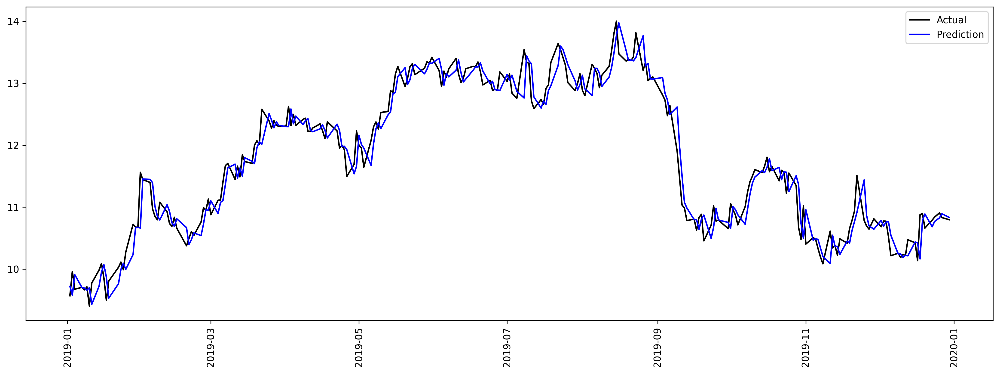

12
13


<Figure size 432x288 with 0 Axes>

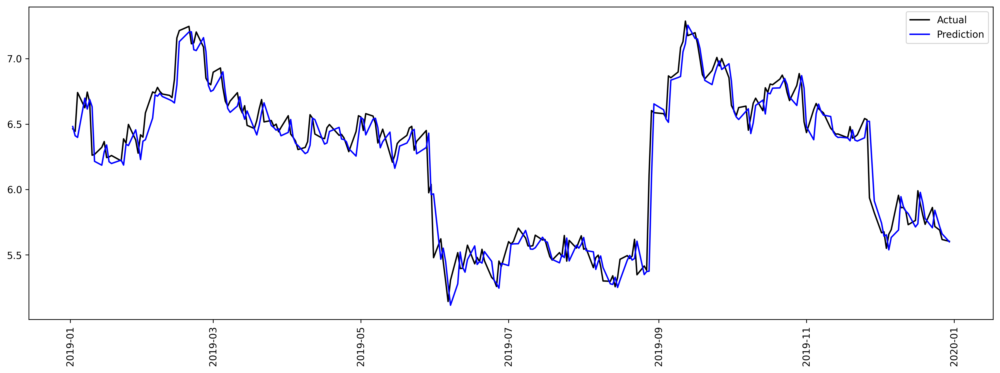

14


<Figure size 432x288 with 0 Axes>

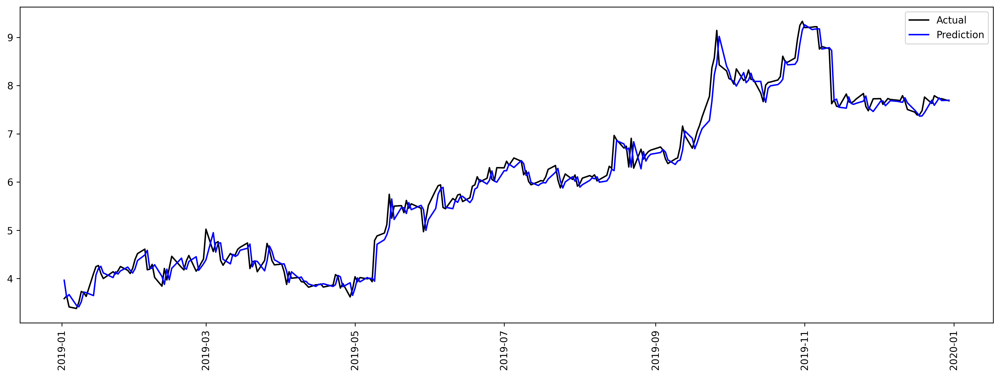

15


<Figure size 432x288 with 0 Axes>

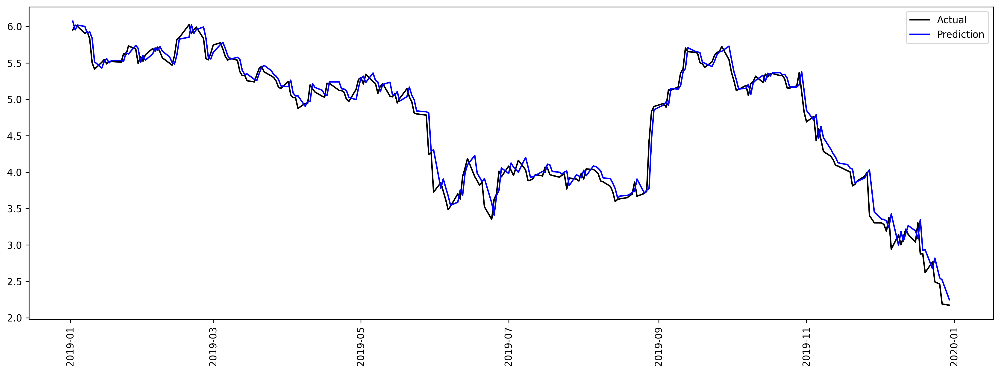

16


<Figure size 432x288 with 0 Axes>

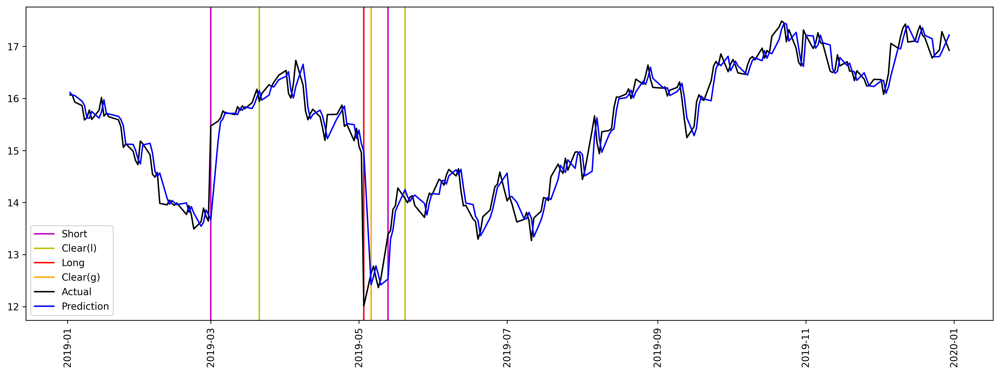

17
18


<Figure size 432x288 with 0 Axes>

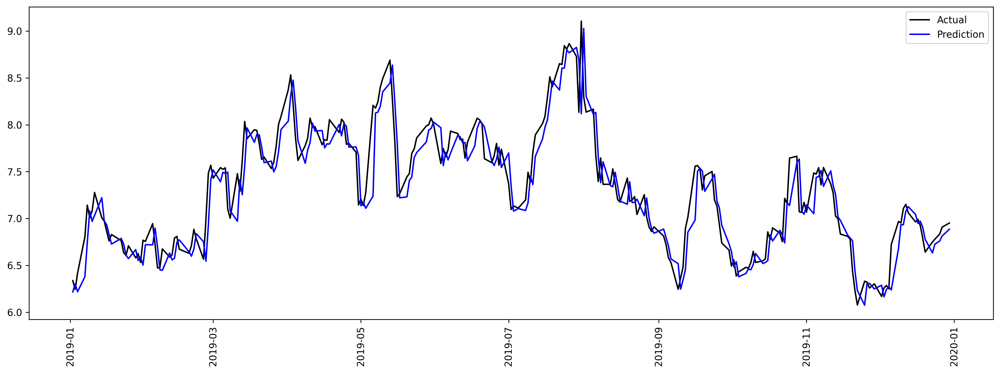

19


<Figure size 432x288 with 0 Axes>

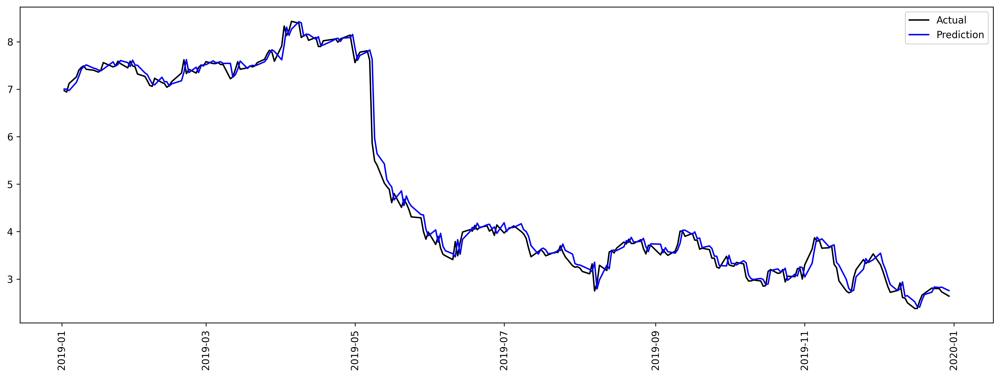

In [106]:
for i in range(len(dfarima)):
  print(i)
  if accl[i]!='nan':



    plt.figure(i)
    spread=dfarima.iloc[i]['spread']
    r=accl[i].ShowTradeRecord()
    acctime=r['time'].unique()

    dp.SRPlot([spread,dfarima.iloc[i]['ARIMA_test']],['Actual','Prediction'],['black','blue'],start=test_s,end=test_e,xvline=True,listofxvlines=acctime,
            xvColor=True,xvColorDic=colorDic,xvColorIndex=recordl[i][1:])
    